# Physics 559 - Gravitation and Cosmology

## Tucker Knaak - Department of Physics, Creighton University - Fall 2022

### Final Project - Numerically Solving the Geodesic Equations of the Schwarzschild Metric with Python.

#### The Schwarzschild solution is the most general spherically symmetric, static, vacuum solution to Einstein's field equations as proved by Birkhoff's Theorem.  This metric introduced the notion of singularities in general relativity and led to the discovery of black holes.  The geodesics of the Schwarzschild solution have many applications and can be used to describe planetary orbits in solar systems as well as the path of light near black holes.  This paper shows a derivation of the Schwarzschild metric and examines the geodesic equations governing the orbits of both massive and massless particles near a black hole.  I then employ the fourth order Yoshida algorithm to numerically solve the equations for photons in Python and plot different types of possible orbits.

In [1]:
'''Required Libraries'''
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import numpy as np

'''Required Functions'''
from IPython.display import HTML, display
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from matplotlib.patches import Circle

### Effective Potential $V_{\text{eff}}(r)$.

#### The effective potential of the Schwarzschild metric is given by $V_{\text{eff}}(r)=\frac{1}{2}\left(1-\frac{2GM}{r}\right)\left(\epsilon+\left(\frac{\tilde{L}}{r}\right)^2\right),$ where $\tilde{L}=L/M$ is the angular momentum per unit mass and $\epsilon=0$ for massless particles and $\epsilon=1$ for massive particles.  We see three parts to the effective potential:

##### 1. $1/r$: usual attractive term as expected
##### 2. $1/r^2$: repulsive term as expected
##### 3. $1/r^3$: relativistic attractive term unique to general relativity.

#### We set $G=M=1$ and plot the effective potential for values of $L$ ranging from $0$ to $5$ for both massless and massive particles and identify types of possible orbits.

In [2]:
'''Function to calculate the effective potential'''
def Veff(e: int, r: float, L: int):
    V = 0.5 * (1 - ((2*G*M) / r)) * (e + ((L**2) / (r**2)))
    return V

'''Use natural units'''
G = 1  #gravitational constant
M = 1  #mass of black hole

'''Set angular momentum values'''
L_list = np.linspace(0, 5, 6, dtype = int)
colors = plt.cm.viridis(np.linspace(0, 0.8, 6))

'''Set radius values'''
r_list = np.linspace(2, 50, 1000)

#### Massless particles with $\epsilon=0$.

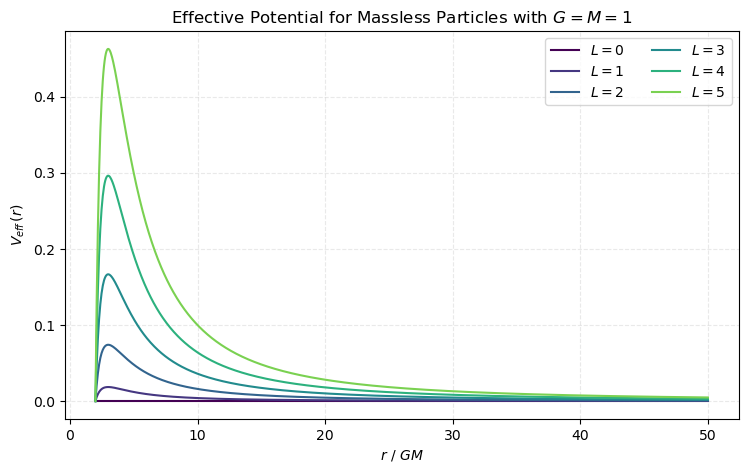

In [3]:
'''Set geodesic normalization'''
e = 0

'''Create figure and plot results'''
fig, ax = plt.subplots(1, 1, figsize = (8, 5))
fig.tight_layout(pad = 3)
ax.set_xlabel('$r\ /\ GM$')
ax.set_ylabel('$V_{eff}\, (r)$')
ax.set_title('Effective Potential for Massless Particles with $G=M=1$')
ax.grid(True, linestyle = 'dashed', color = 'darkgray', alpha = 0.25)
for L in L_list:
    ax.plot(r_list, Veff(0, r_list, L), linestyle = 'solid', color = colors[L], label = f'$L={L}$')
ax.legend(loc = 'upper right', ncols = 2)

'''Save figure'''
fig.savefig('c:/Users/Tucker Knaak/Downloads/EffectivePotential_Massless.png')

#### Massive particles with $\epsilon=1$.

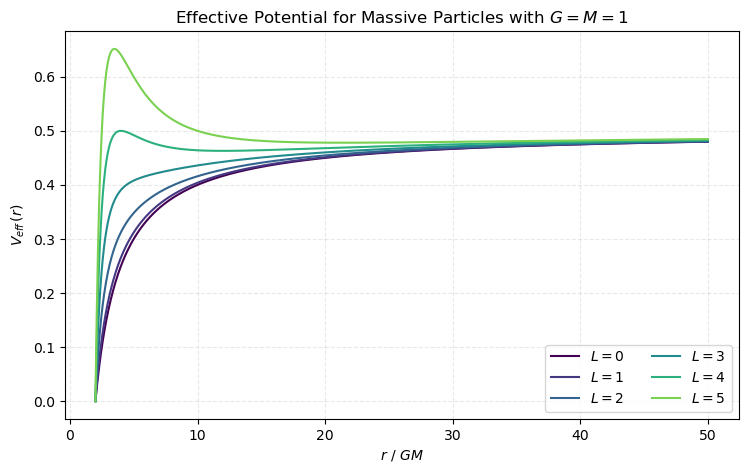

In [4]:
'''Set geodesic normalization'''
e = 1

'''Create figure and plot results'''
fig, ax = plt.subplots(1, 1, figsize = (8, 5))
fig.tight_layout(pad = 3)
ax.set_xlabel('$r\ /\ GM$')
ax.set_ylabel('$V_{eff}\, (r)$')
ax.set_title('Effective Potential for Massive Particles with $G=M=1$')
ax.grid(True, linestyle = 'dashed', color = 'darkgray', alpha = 0.25)
for L in L_list:
    ax.plot(r_list, Veff(1, r_list, L), linestyle = 'solid', color = colors[L], label = f'$L={L}$')
ax.legend(loc = 'lower right', ncols = 2)

'''Save figure'''
fig.savefig('c:/Users/Tucker Knaak/Downloads/EffectivePotential_Massive.png')

In [ ]:
'''Possible orbits'''
L = 4

'''Create figure and plot results'''
fig, ax = plt.subplots(1, 1, figsize = (8, 5))
fig.tight_layout(pad = 3)
ax.set_xlabel('$r\ /\ GM$')
ax.set_ylabel('$V_{eff}\, (r)$')
ax.set_title('Possible Orbits for Massive Particles with $G=M=1,\ L=4$')
ax.set_xlim(2, 50)
ax.set_ylim(0.46, 0.504)
ax.grid(True, linestyle = 'dashed', color = 'darkgray', alpha = 0.25)
ax.plot(r_list, Veff(1, r_list, L), linestyle = 'solid', color = colors[L])

'''Label orbits'''
ax.axhline(0.4629, color = 'black', linestyle = 'dashed', linewidth = 0.95)
ax.axhline(0.48, color = 'black', linestyle = 'dashed', linewidth = 0.95)
ax.axhline(0.49, color = 'black', linestyle = 'dashed', linewidth = 0.95)
ax.axhline(0.5025, color = 'black', linestyle = 'dashed', linewidth = 0.95)
ax.text(41, 0.4635, 'Circular', fontsize = 12)
ax.text(40.5, 0.4775, 'Bounded', fontsize = 12)
ax.text(39, 0.4905, 'Unbounded', fontsize = 12)
ax.text(40.1, 0.50025, 'Captured', fontsize = 12)

'''Save figure'''
fig.savefig('c:/Users/Tucker Knaak/Downloads/PossibleOrbits_Massive.png')

### Photon Orbits.

#### This code simulates photon orbits as they come near the photon capture radius of a Schwarzschild black hole.  If the photons fall within this radius, they are captured by the black hole.  However, for the correct trajectory, the photons are able to circularly orbit the black hole.  The radial equation is solved with the 4th-Order Yoshida algorithm, and the trajectories are plot and animated.

In [5]:
class PhotonOrbits():
    
    '''Internal function to initialize the system'''
    def __init__(self):
        
        '''Black-hole parameters'''
        self.b0 = np.sqrt(27) / 2  #critical impact parameter
        self.rs = 1                #Schwarzschild radius
        self.patches = []          #list of patches to draw the black hole
        
        '''Photon orbit parameters'''
        self.dphi = 0.1        #step size of phi
        self.ds2 = 0.01        #minimum square of line element
        self.maxsteps = 10000  #maximum number of steps for the numerical solution
        self.orbit = 0         #chosen orbit to animate
        self.colors = []       #list of colors of lines
        self.delta_list = []   #list of delta values away from critical impact parameter
        
        '''Trajectory of photon'''
        self.x_dict = {}   #x-component of position of photons [rs]
        self.y_dict = {}   #y-component of position of photons [rs]
        self.wx_dict = {}  #x-component of angular velocity of photons [rs / rad]
        self.wy_dict = {}  #y-component of angular velocity of photons [rs / rad]
        
        
    '''Internal function to set the initial conditions'''
    def _set(self, num: int, r: float, phi: float):
        
        '''Populate dictionaries'''
        x, y, u = r * np.cos(phi), r * np.sin(phi), 1 / r
        dx = -r * np.sin(phi) + np.cos(phi) * u
        dy = r * np.cos(phi) + np.sin(phi) * u
        self.x_dict[num] = [x]
        self.y_dict[num] = [y]
        self.wx_dict[num] = [dx]
        self.wy_dict[num] = [dy]
        
        
    '''Internal function to append the relevant data'''
    def _append(self, num: int, r: float, phi: float):
        
        '''Positions'''
        x, y, u = r * np.cos(phi), r * np.sin(phi), 1 / r
        self.x_dict[num].extend([x])
        self.y_dict[num].extend([y])
        
        '''Angular Velocities'''
        dx = -r * np.sin(phi) + np.cos(phi) * u
        dy = r * np.cos(phi) + np.sin(phi) * u
        self.wx_dict[num].extend([dx])
        self.wy_dict[num].extend([dy])
        
        
    '''Internal function to append the relevant data if specific critera is satisfied'''
    def _check(self, num: int, r: float, phi: float):
        
        '''Check non-empty dictionary'''
        if self.x_dict:
            
            '''Previous radius and angle'''
            r0 = np.sqrt(self.x_dict[num][-1]**2 + self.y_dict[num][-1]**2)
            phi0 = np.arctan2(self.y_dict[num][-1], self.x_dict[num][-1])
            
            '''Difference in radius and angle'''
            dr = r - r0
            dphi = phi - phi0
            
            '''Check line element --> append if criteria satisfied'''
            ds2 = (dr**2) + (r0 * dphi)**2  #ds^2 = dr^2 + r^2*dphi^2
            if self.ds2 < ds2:
                self._append(num, r, phi)
                
                
    '''Internal function to return the coefficients for the 4th-Order Yoshida algorithm'''
    def coefficients(self):
        a = 2**(1 / 3)
        b = 2 - a
        w0 = -a / b
        w1 = 1 / b
        c1 = w1 / 2
        c2 = (w0 + w1) / 2
        return (c1, c2, c2, c1), (w1, w0, w1)
        
        
    '''Internal function to calculate the acceleration of the photon from its inverse radius'''
    def acceleration(self, u: float):
        acc = (1.5 * u**2) - u
        return acc
        
        
    '''Internal function to conduct the 4th-Order Yoshida algorithm to numerically solve the ODE for the orbit'''
    def Yoshida(self, num: int, phi: float, u: float, w: float):
        
        '''Get coefficients'''
        yc, yd = self.coefficients()
        
        '''Calculate ODE for the orbit while True'''
        u0 = u    #initial inverse radius
        step = 1  #number of steps
        while True:
            
            '''Increase phi'''
            phi += self.dphi
            
            '''4th-Order Yoshida algorithm'''
            for c, d in zip(yc, yd):
                u += c * w * self.dphi                     #inverse radius step
                w += d * self.acceleration(u) * self.dphi  #angular momentum step
            u += yc[-1] * w * self.dphi
            
            '''Check if orbit complete'''
            final = step == self.maxsteps or (step % 2 == 0 and not u0 <= u < 100)  #boolean mask for check
            self._check(num, 1 / u, phi)
            if final:
                break
            
            '''Iterate next step'''
            step += 1
            
            
    '''Internal function to create patches for the black hole'''
    def black_hole(self):
        
        '''Black hole'''
        black_hole = Circle((0, 0), 0.1, color = 'black')
        self.patches.append(black_hole)
        
        '''Event horizon'''
        event_horizon = Circle((0, 0), self.rs, color = 'black', linestyle = 'dashed', linewidth = 2.0, fill = False)
        self.patches.append(event_horizon)
        
        '''Circular photon orbit'''
        circular_orbit = Circle((0, 0), self.rs * 1.5, color = 'darkgray', linestyle = 'dashed', fill = False)
        self.patches.append(circular_orbit)
        
        
    '''Function called by the user to calculate the trajectory of the photon orbits;
       *args is a tuple of delta values to use for the initial conditions'''
    def calculate_orbits(self, phi0: float, *args: list):
        
        '''Set given data'''
        self.delta_list = list(args)    #list of delta values to test
        
        '''Calculate trajectory for each delta value'''
        for num in range(1, len(self.delta_list) + 1):
            
            '''Initial conditions'''
            b = self.b0 + self.delta_list[num - 1]    #critical impact parameter + delta (y-coordinate)
            phi = phi0 * np.pi / 180                  #angle [rad]
            r = b / np.sin(phi)                       #radius [rs]
            u = 1 / r                                 #inverse radius [1 / rs]
            w = np.sqrt((1 / b**2) - (1 - u) * u**2)  #angular velocity [rs / rad]
            self._set(num, r, phi)                    #append initial conditions
            
            '''4th-Order Yoshida algorithm'''
            self.Yoshida(num, phi, u, w)
            
            
    '''Function called by the user to plot the trajectory of the photon orbits'''
    def plot_orbits(self, title: str, show_colorbar = True, save_fig = True):
        
        '''Create patches for black hole'''
        self.black_hole()
        
        '''Create figure and plot results'''
        fig, ax = plt.subplots(1, 1, figsize = (5, 5))
        fig.tight_layout(pad = 3)
        ax.set_xlabel('$x\ /\ r_s$')
        ax.set_ylabel('$y\ /\ r_s$')
        ax.set_title(title)
        ax.set_xlim([-3, 3])
        ax.set_ylim([-3, 3])
        ax.set_aspect('equal')
        ax.grid(True, linestyle = 'dashed', color = 'gray', alpha = 0.1)
        
        '''Draw black hole'''
        for patch in self.patches:
            ax.add_patch(patch)
            
        '''Plot orbits'''
        self.colors = plt.cm.plasma(np.linspace(0, 0.85, len(self.delta_list)))
        for num in range(1, len(self.delta_list) + 1):
            ax.plot(self.x_dict[num], self.y_dict[num], linestyle = 'solid', color = self.colors[num - 1])
            
        '''Add colorbar'''
        if show_colorbar:
            norm = Normalize(vmin = min(self.delta_list), vmax = max(self.delta_list))
            sm = ScalarMappable(cmap = plt.cm.plasma, norm = norm)
            sm.set_array([])
            cbar = plt.colorbar(sm, ax = ax, fraction = 0.045, pad = 0.075)
            cbar.set_label('$\delta$')
            cbar.ax.yaxis.set_label_position('left')
        
        '''Save figure'''
        if save_fig:
            filename = input('What is the filename? ')
            fig.savefig(f'c:/Users/Tucker Knaak/Downloads/{filename}.png')
            
            
    '''Internal function to update the animation of the trajectory of the photon orbits'''
    def update(self, step: int, line,):
        line.set_data(self.x_dict[self.orbit][:step], self.y_dict[self.orbit][:step])
        return line,
    
    
    '''Function called by the user to animate the trajectory of a given photon orbit'''
    def animate_orbits(self, title: str, num: int, save_fig = True):
        
        '''Create patches for black hole'''
        self.patches = []
        self.black_hole()
        
        '''Create figure and plot results'''
        fig, ax = plt.subplots(1, 1, figsize = (5, 5))
        fig.tight_layout(pad = 3)
        ax.set_xlabel('$x\ /\ r_s$')
        ax.set_ylabel('$y\ /\ r_s$')
        ax.set_title(title)
        ax.set_xlim([-3, 3])
        ax.set_ylim([-3, 3])
        ax.set_aspect('equal')
        ax.grid(True, linestyle = 'dashed', color = 'gray', alpha = 0.1)
        
        '''Draw black hole'''
        for patch in self.patches:
            ax.add_patch(patch)
            
        '''Plot orbit'''
        self.orbit = num
        line, = ax.plot(self.x_dict[num], self.y_dict[num], linestyle = 'solid', color = self.colors[num - 1])
        
        '''Animate orbit'''
        ani = animation.FuncAnimation(fig, self.update, frames = len(self.x_dict[num]), interval = 50,
                                      blit = True, fargs = (line,))
        html = HTML(ani.to_jshtml())
        display(html)
        plt.close()
        
        '''Save animation'''
        if save_fig:
            filename = input('What is the filename? ')
            f = r'c:/Users/Tucker Knaak/Downloads/{}.gif'.format(filename) 
            writergif = animation.PillowWriter(fps = len(self.x_dict[num]) // 5) 
            ani.save(f, writer = writergif)

#### The critical impact parameter, which is the closest approach of the photon before capture, is given by $b_0=(\sqrt{27}/2)r_s$.  We set the initial $y$-coordinate to be the critical impact parameter and then perturb it, such that $y_0=b_0+\delta$.  We choose thirty $\delta$ values ranging from $0$ to $0.3$ and thirty $\delta$ values ranging from $-0.3$ to $0$ and plot the orbits.

What is the filename? 


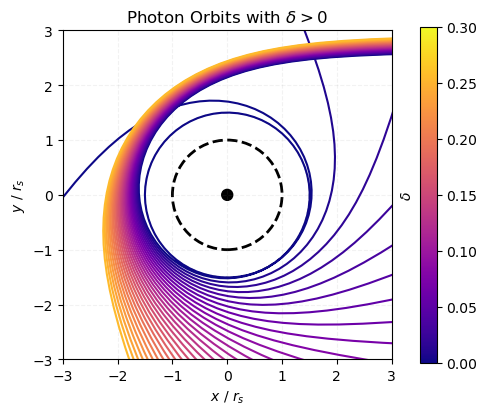

In [6]:
'''Positive perturbations of delta'''
positive = PhotonOrbits()
positive.calculate_orbits(30, *np.linspace(0, 0.3, 30))
positive.plot_orbits('Photon Orbits with $\delta>0$')

What is the filename? 


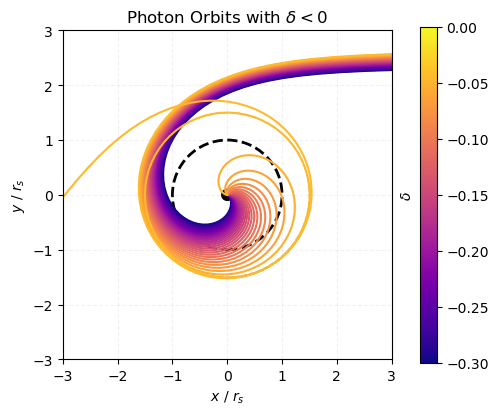

In [7]:
'''Negative perturbations of delta'''
negative = PhotonOrbits()
negative.calculate_orbits(30, *np.linspace(-0.3, 0, 30))
negative.plot_orbits('Photon Orbits with $\delta<0$')

#### It has been shown that multiplying the perturbation $\delta$ by factors of $e^{-2\pi n}$ will make the photon loop around the black hole $n$ times.  We choose as well as $n=1$ and $n=2$ to plot both one and two loop escapes and captures.

What is the filename? 


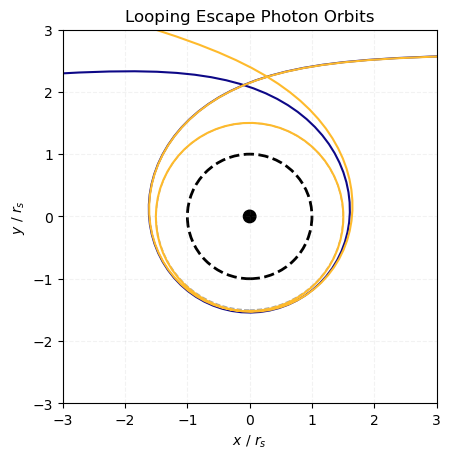

In [8]:
escape = PhotonOrbits()
escape.calculate_orbits(30, *[0.003, 0.003 * np.exp(-2 * np.pi)])
escape.plot_orbits('Looping Escape Photon Orbits', show_colorbar = False)

What is the filename? 


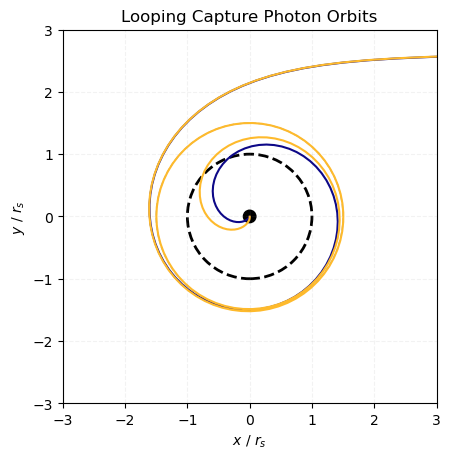

In [9]:
capture = PhotonOrbits()
capture.calculate_orbits(30, *[-0.003, -0.003 * np.exp(-2 * np.pi)])
capture.plot_orbits('Looping Capture Photon Orbits', show_colorbar = False)

#### We can now animate the one loop escape and two loop capture.

In [11]:
escape.animate_orbits('One Loop Escape', 1)

What is the filename? Escape


In [12]:
capture.animate_orbits('Two Loop Capture', 2)

What is the filename? Capture
